In [6]:
%pip install ultralytics --quiet
import ultralytics
ultralytics.checks()

!nvidia-smi

!ls

Ultralytics YOLOv8.2.11 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5597.8/8062.4 GB disk)
Thu May  9 20:14:43 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P0              40W / 250W |    482MiB / 16384MiB |      0%      Default |
|  

In [7]:
!pip install roboflow --quiet
!pip install ultralytics==8.0.196 --quiet
import warnings
from roboflow import Roboflow

# Suprimir mensagens de advertência
warnings.filterwarnings("ignore")

# Restaurar mensagens de advertência padrão
warnings.filterwarnings("default")

# Suprimir mensagens de advertência
warnings.filterwarnings("ignore")

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="1uaBIxC6yfhPjoHi8YF3")
project = rf.workspace("rsreu").project("test-iwmwd")
version = project.version(2)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.11, to fix: `pip install ultralytics==8.0.196`


In [8]:
import yaml

# Caminho para o arquivo data.yaml
yaml_file_path = "/kaggle/working/test-2/data.yaml"

# Carregar o arquivo YAML
with open(yaml_file_path, 'r') as file:
    data = yaml.safe_load(file)

# Atualizar os caminhos
data['test'] = "/kaggle/working/test-2/test"
data['train'] = "/kaggle/working/test-2/train/images"
data['val'] = "/kaggle/working/test-2/valid/images"

# Salvar as alterações de volta no arquivo YAML
with open(yaml_file_path, 'w') as file:
    yaml.dump(data, file)

# Imprimir o conteúdo atualizado
print(data)


{'names': ['person'], 'nc': 1, 'roboflow': {'license': 'Public Domain', 'project': 'test-iwmwd', 'url': 'https://universe.roboflow.com/rsreu/test-iwmwd/dataset/2', 'version': 2, 'workspace': 'rsreu'}, 'test': '/kaggle/working/test-2/test', 'train': '/kaggle/working/test-2/train/images', 'val': '/kaggle/working/test-2/valid/images'}


In [9]:
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=25 imgsz=800 plots=True


New https://pypi.org/project/ultralytics/8.2.11 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/test-2/data.yaml, epochs=25, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augmen

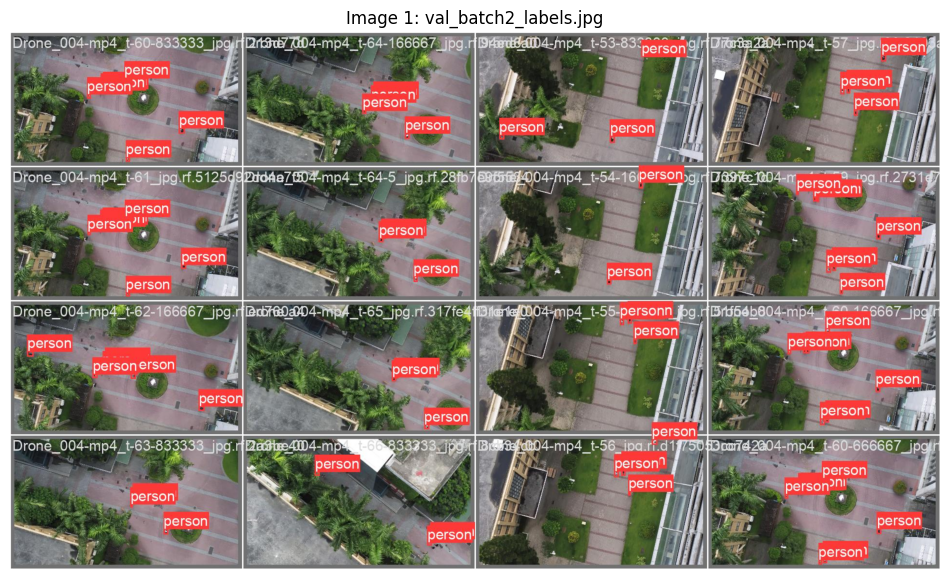

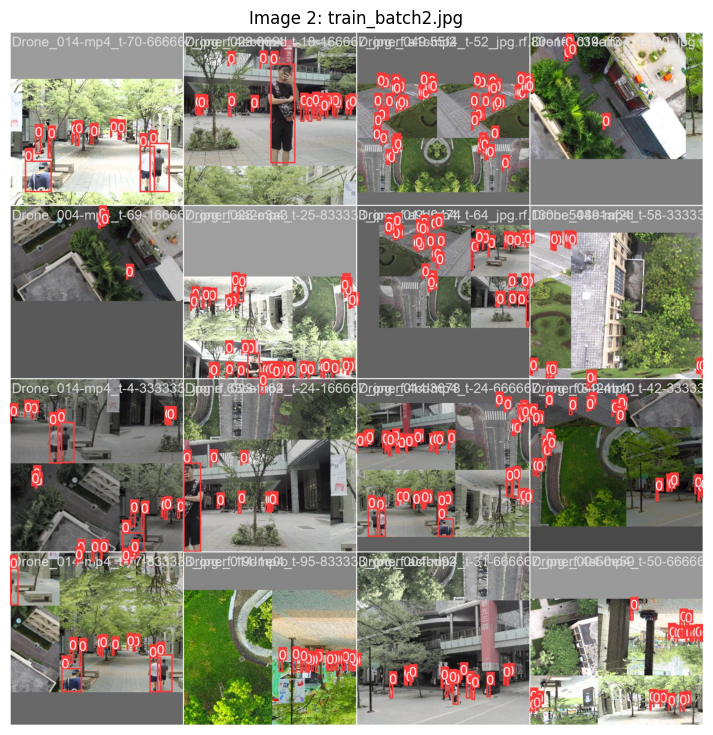

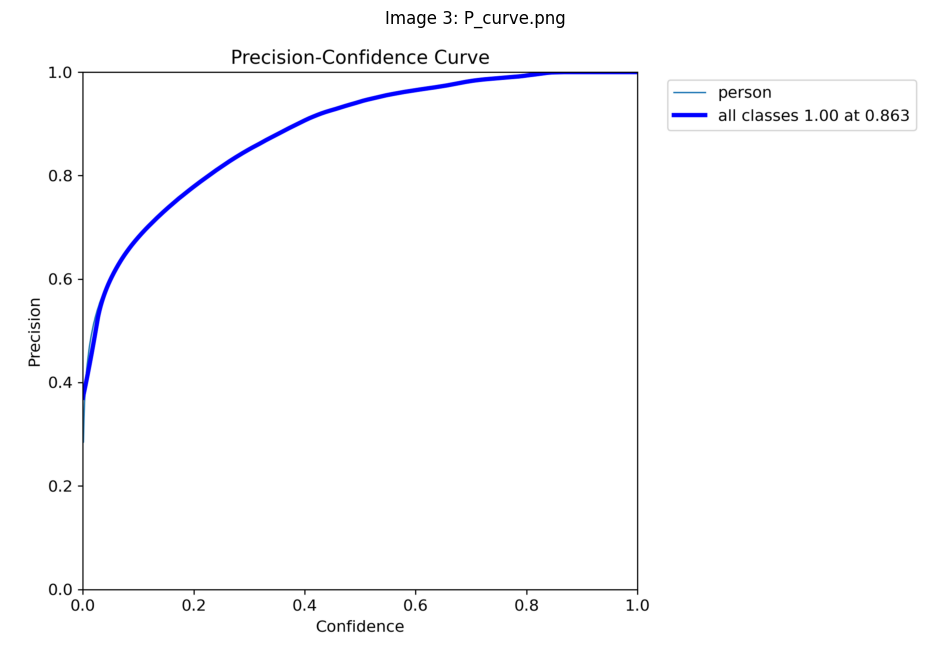

Erro ao abrir a imagem P_curve.png: cannot write mode RGBA as JPEG


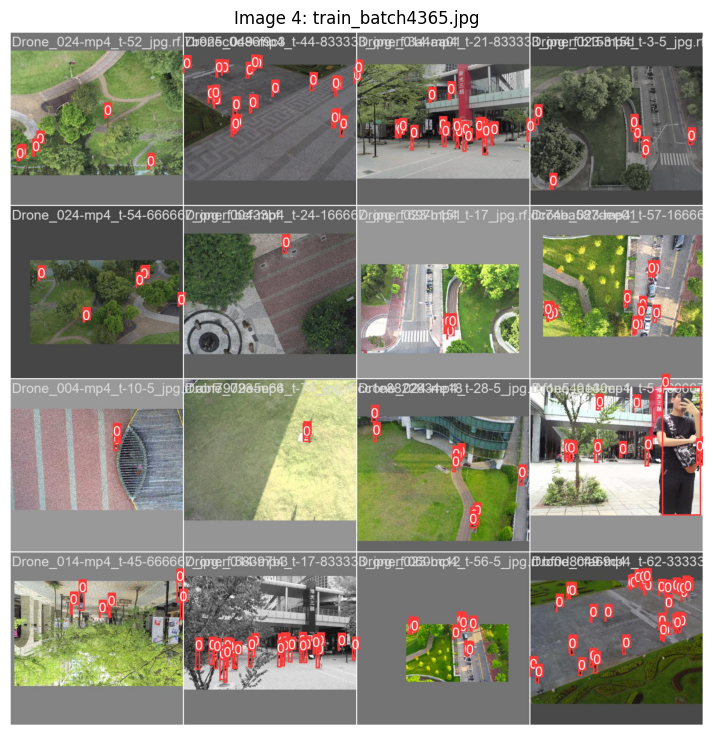

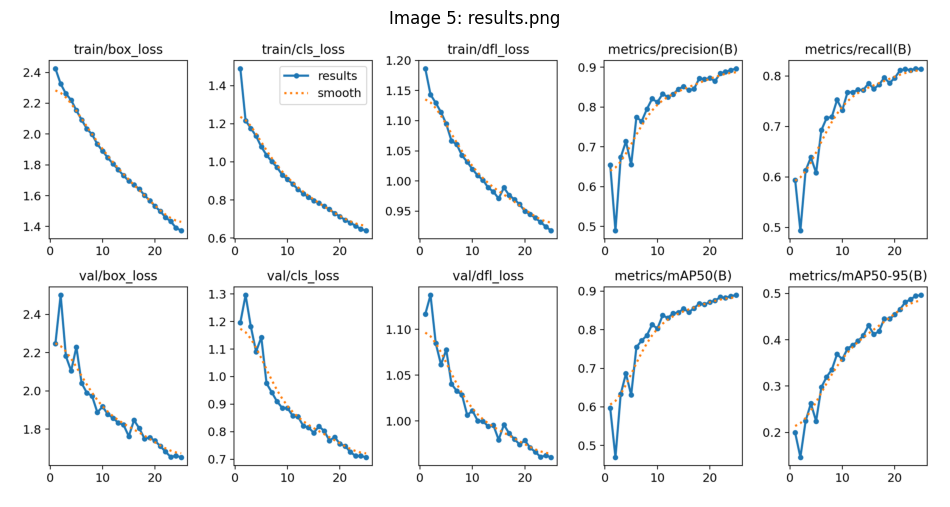

Erro ao abrir a imagem results.png: cannot write mode RGBA as JPEG


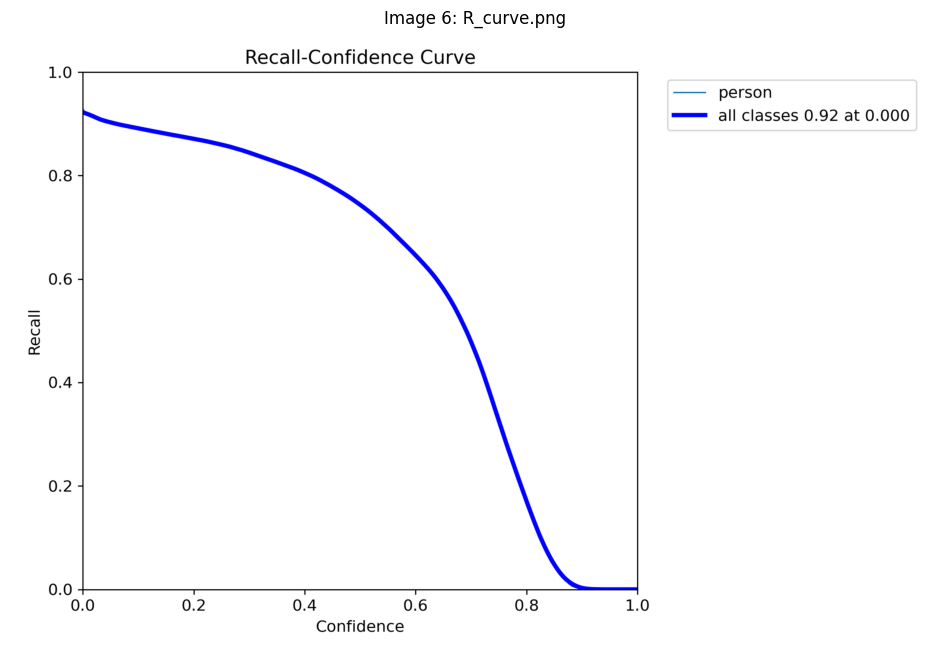

Erro ao abrir a imagem R_curve.png: cannot write mode RGBA as JPEG


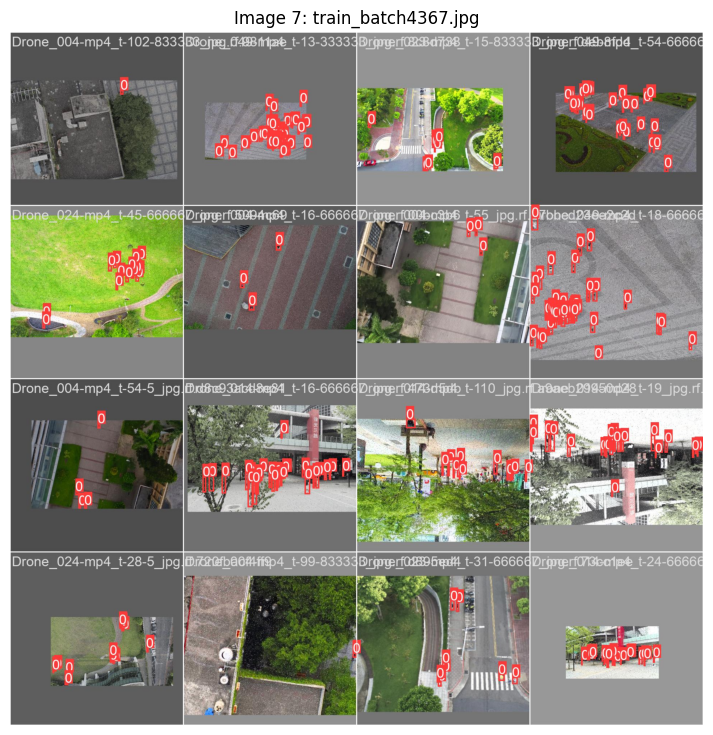

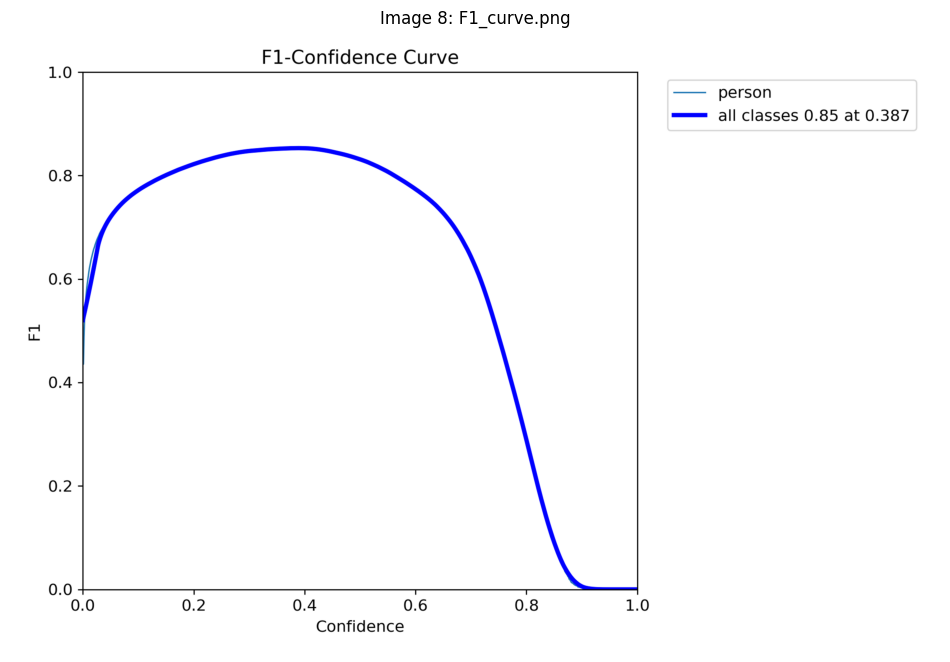

Erro ao abrir a imagem F1_curve.png: cannot write mode RGBA as JPEG


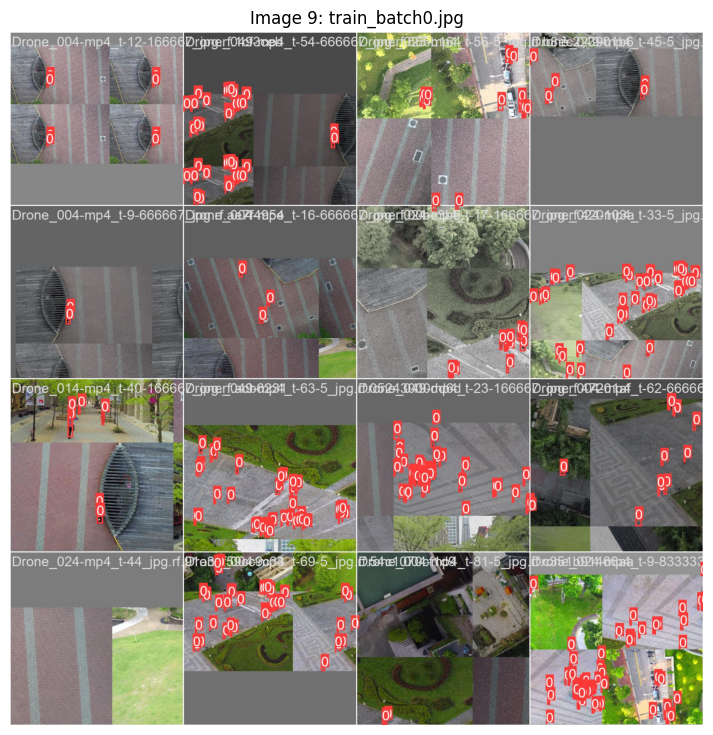

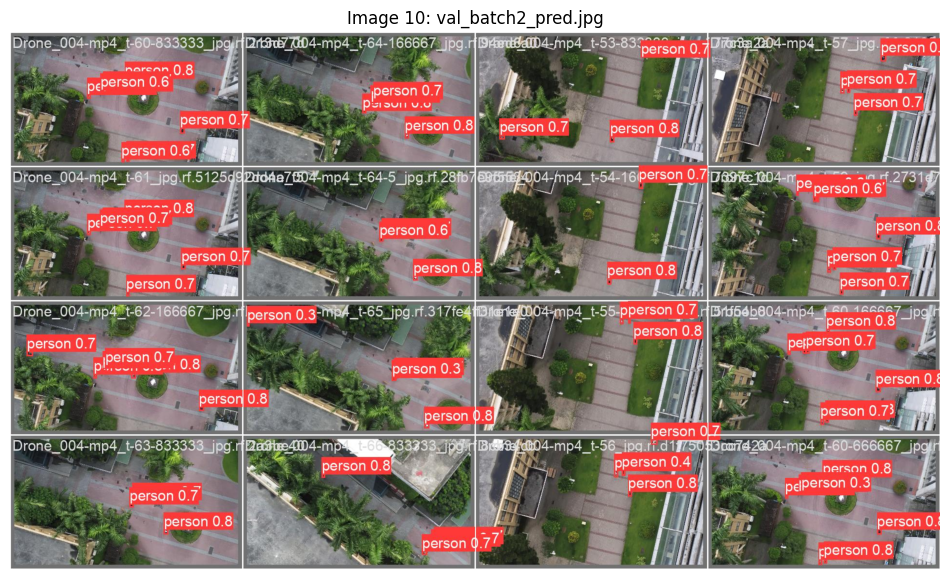

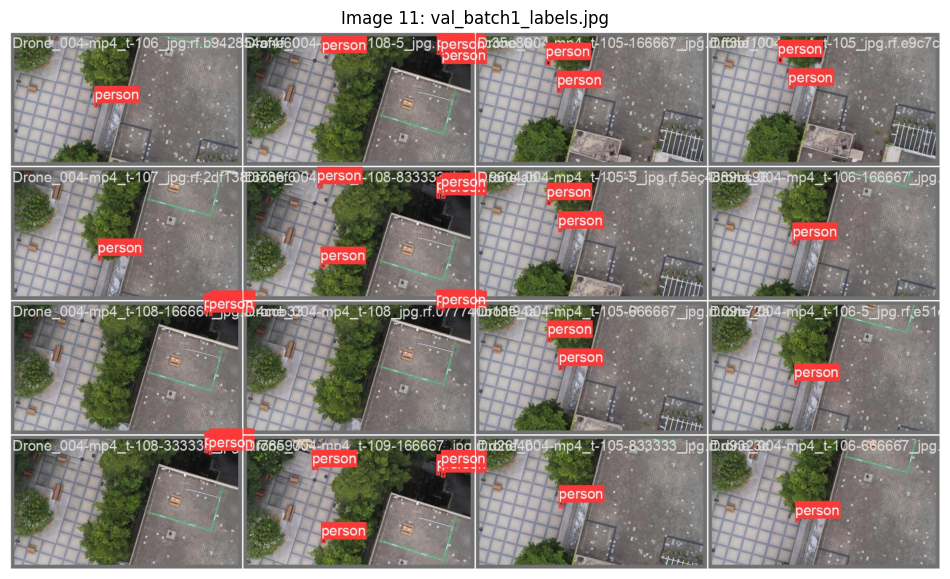

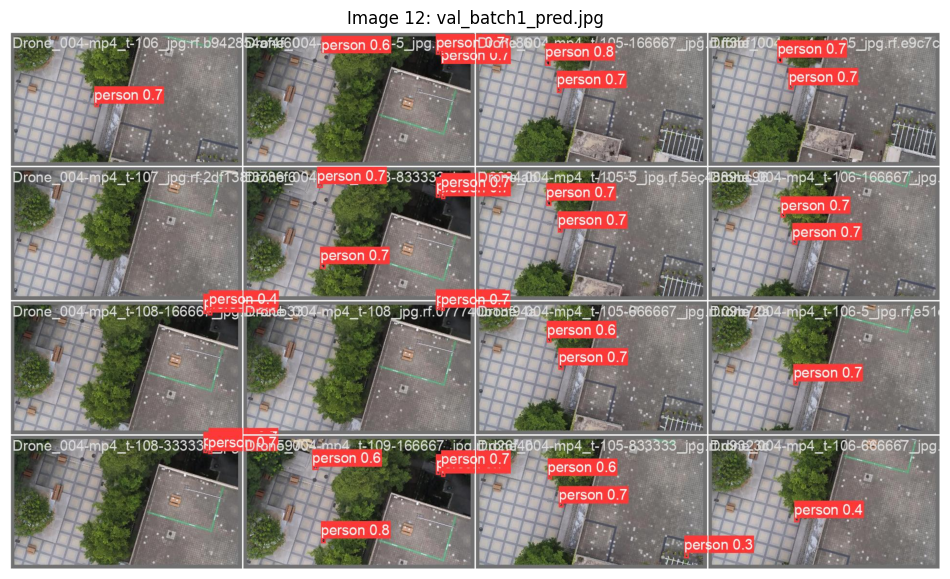

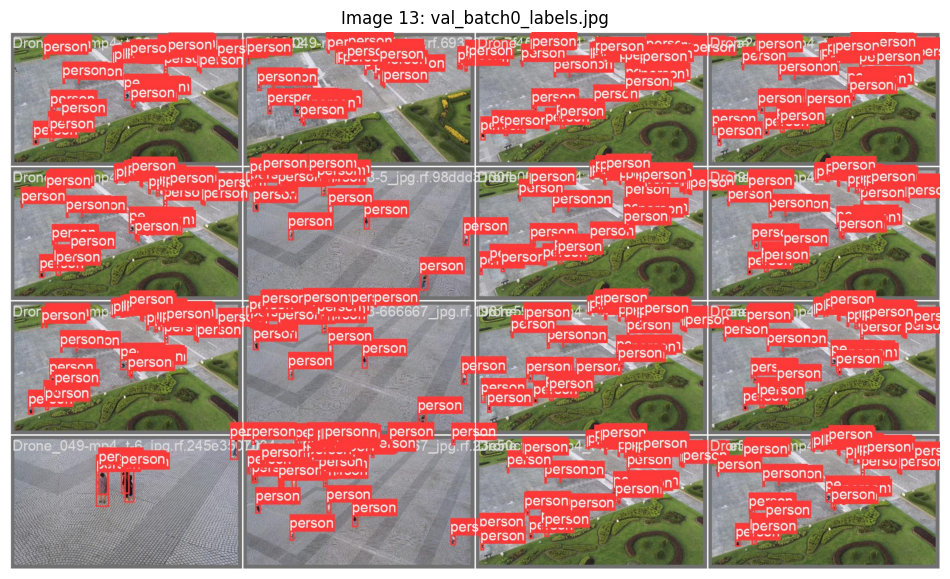

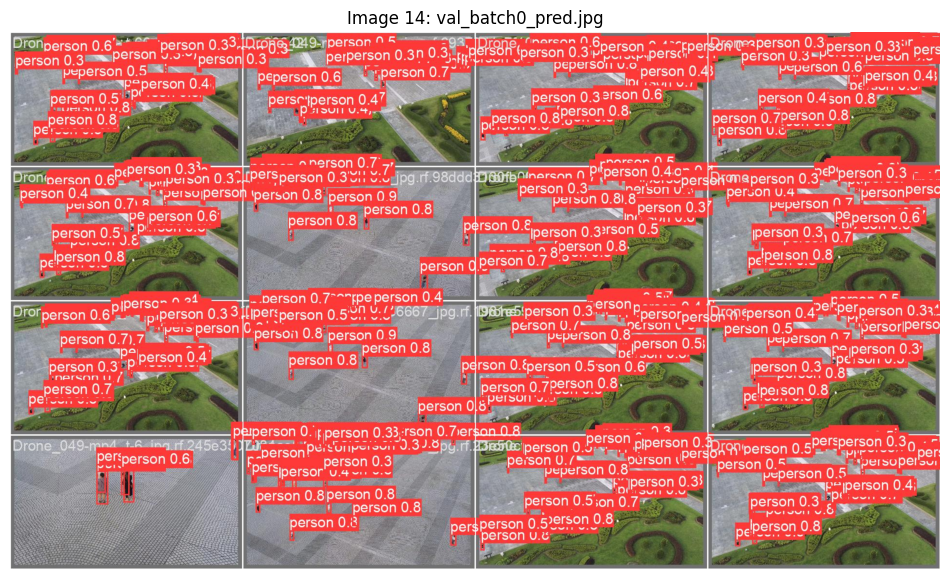

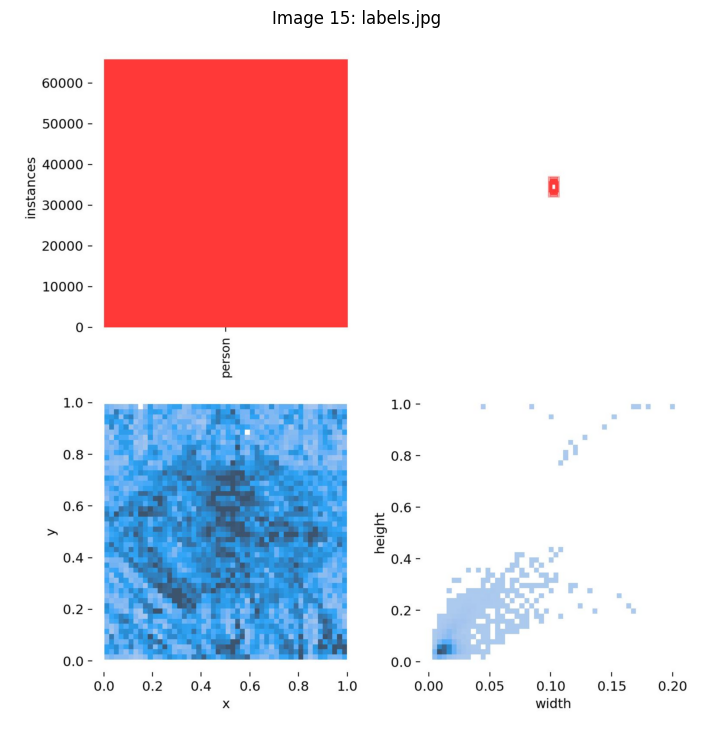

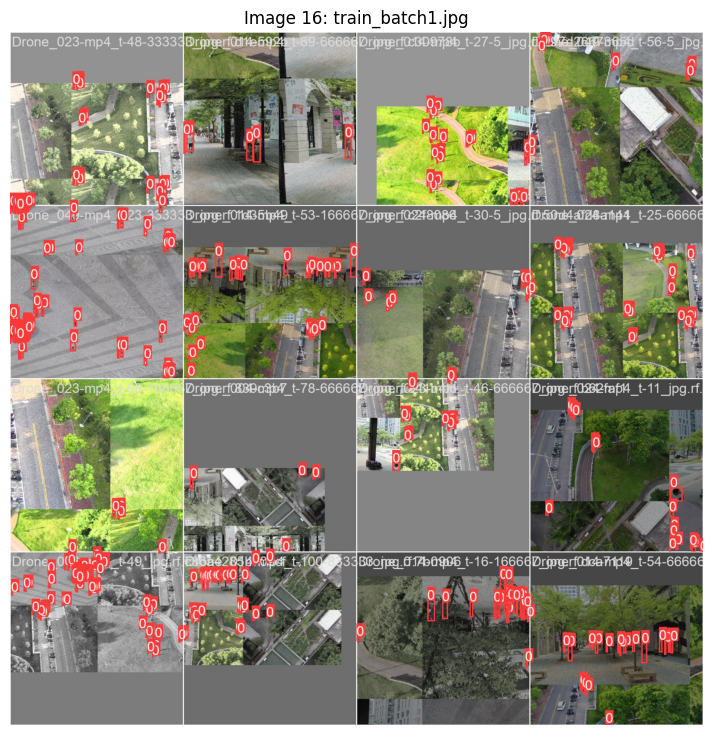

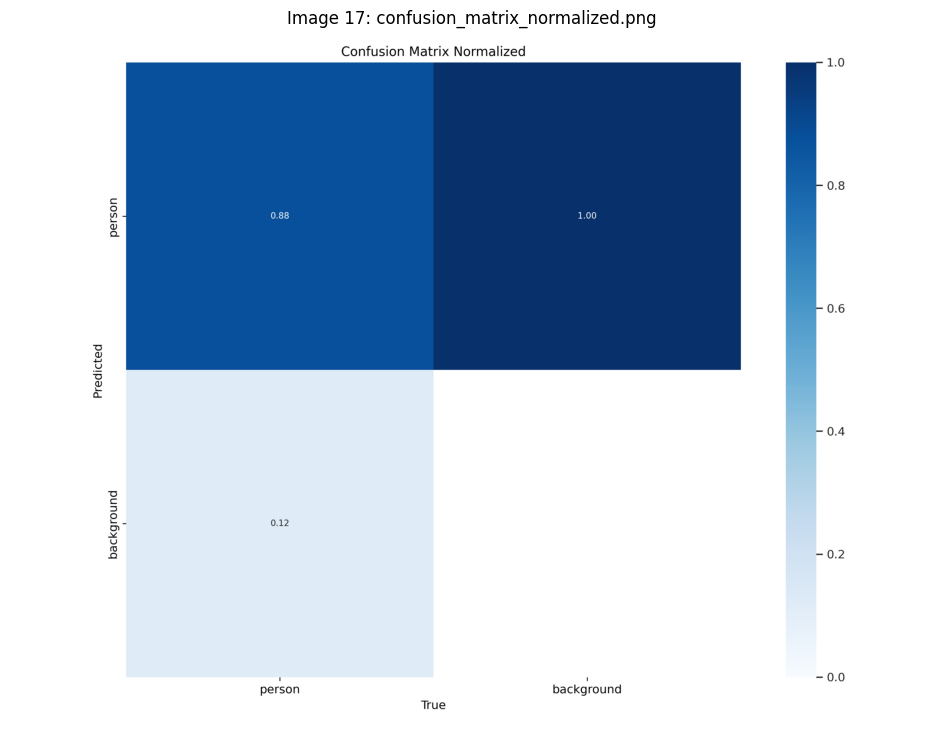

Erro ao abrir a imagem confusion_matrix_normalized.png: cannot write mode RGBA as JPEG


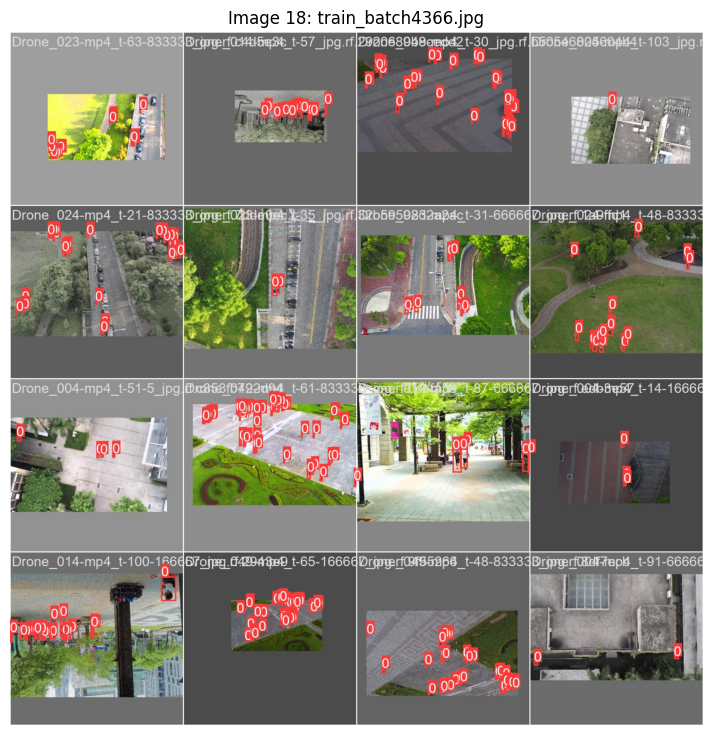

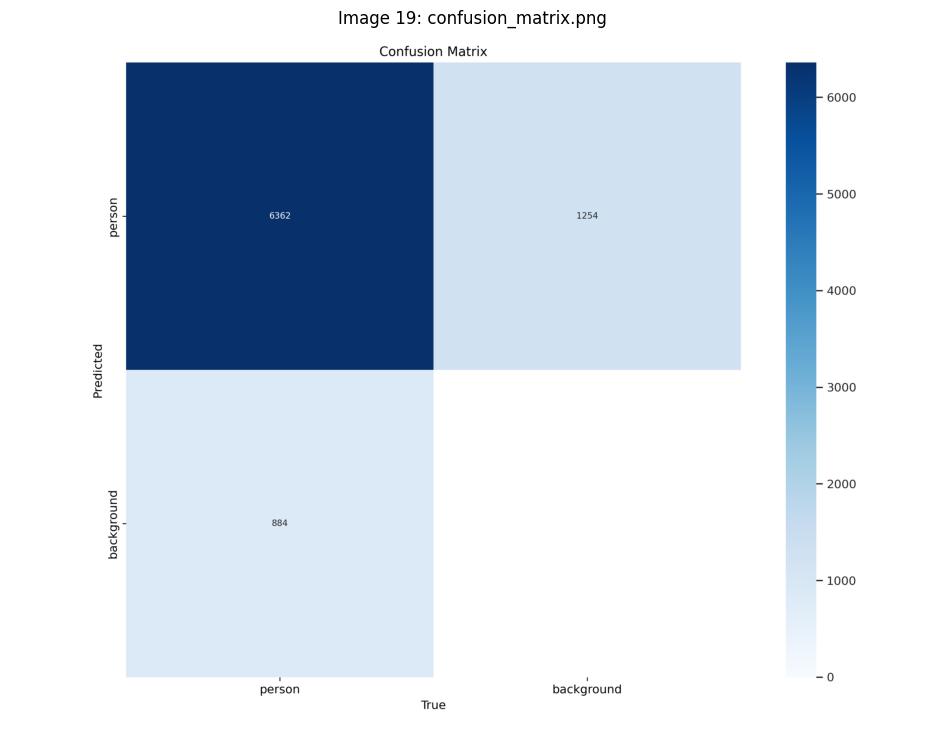

Erro ao abrir a imagem confusion_matrix.png: cannot write mode RGBA as JPEG


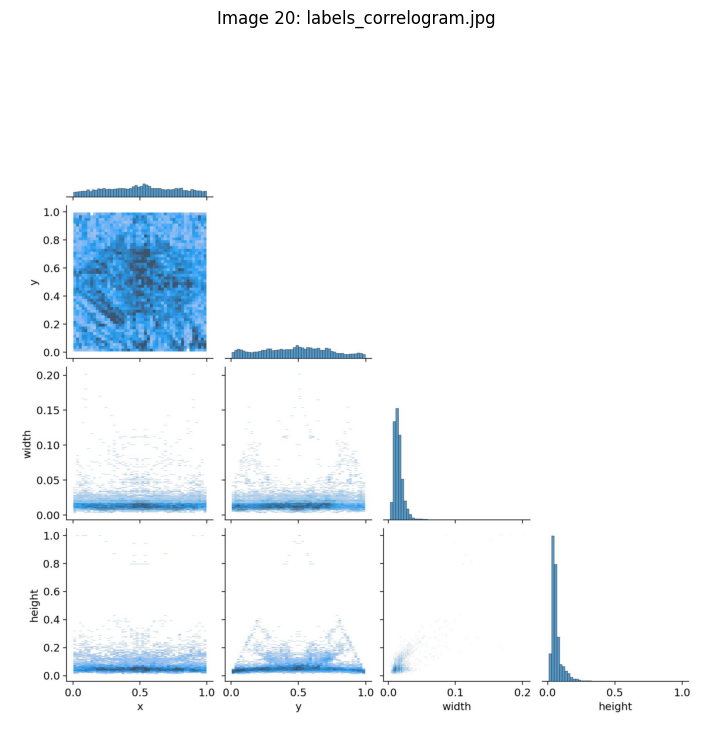

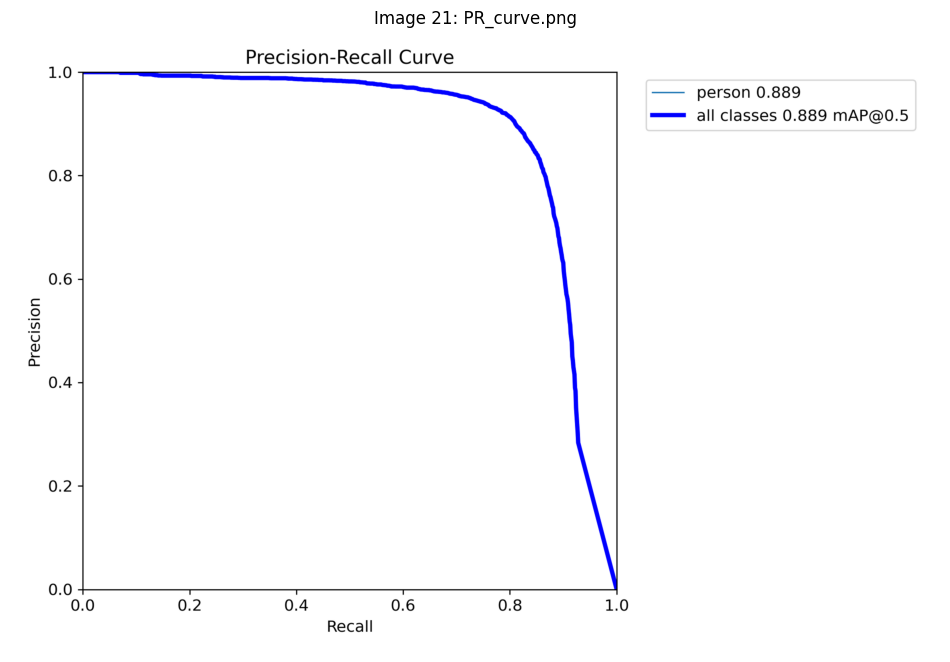

Erro ao abrir a imagem PR_curve.png: cannot write mode RGBA as JPEG
Imagens aumentadas e salvas em /kaggle/working/images.zip


In [10]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import zipfile

# Diretório das imagens
images_dir = "/kaggle/working/runs/detect/train3"

# Lista todos os arquivos no diretório
image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff'))]

# Criação do arquivo zip
zip_file_path = "/kaggle/working/images.zip"
with zipfile.ZipFile(zip_file_path, 'w') as zipf:
    # Plot das imagens separadamente
    for i, image_file in enumerate(image_files, 1):
        image_path = os.path.join(images_dir, image_file)
        try:
            image = Image.open(image_path)
            # Aumento do tamanho da imagem
            image = image.resize((image.width * 2, image.height * 2))
            plt.figure(figsize=(12, 9))
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"Image {i}: {image_file}")
            plt.show()
            # Salva a imagem aumentada no arquivo zip
            with zipf.open(image_file, 'w') as img_zip:
                image.save(img_zip, format='JPEG')  # Especifica o formato de salvamento como JPEG
        except (OSError, IOError) as e:
            print(f"Erro ao abrir a imagem {image_file}: {e}")

# Mensagem de conclusão
print(f"Imagens aumentadas e salvas em {zip_file_path}")
